In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import astropy.units as u # I use astropy units in everything, very helpful for bookkeeping/debugging

from lim import lim # The base intensity mapping object

matplotlib.rcParams.update({'font.size': 18,'figure.figsize':[8,7]}) # Make figures better
#matplotlib.rcParams,update({}'figure.figsize'] = [8,7]
from scipy.ndimage import gaussian_filter

In [2]:
# Initialize LineModel with default model
m = lim()
m_cii = lim('Lichen_v2', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [5]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1
zs

array([5.80974359, 5.88031088, 5.95235602, 6.02592593, 6.10106952,
       6.17783784, 6.25628415, 6.33646409, 6.41843575, 6.50225989,
       6.588     , 6.67572254, 6.76549708, 6.85739645, 6.95149701,
       7.04787879, 7.14662577, 7.24782609, 7.35157233, 7.45796178,
       7.56709677])

In [3]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1
zs

array([5.78846918, 5.81556886, 5.84288577, 5.87042254, 5.89818182,
       5.92616633, 5.95437882, 5.98282209, 6.01149897, 6.04041237,
       6.06956522, 6.0989605 , 6.12860125, 6.15849057, 6.18863158,
       6.21902748, 6.24968153, 6.28059701, 6.3117773 , 6.34322581,
       6.374946  , 6.40694143, 6.43921569, 6.47177243, 6.50461538,
       6.53774834, 6.57117517, 6.60489978, 6.63892617, 6.67325843,
       6.70790068, 6.74285714, 6.77813212, 6.81372998, 6.84965517,
       6.88591224, 6.9225058 , 6.95944056, 6.99672131, 7.03435294,
       7.07234043, 7.11068884, 7.14940334, 7.18848921, 7.22795181,
       7.26779661, 7.3080292 , 7.34865526, 7.38968059, 7.43111111,
       7.47295285, 7.51521197, 7.55789474, 7.60100756])

In [5]:
zs[7]

5.982822085889565

In [21]:
dnu_t = np.linspace(1, 2, 10000)

In [22]:
lenz = [0 for i in range(len(dnu_t))]

for i in range(len(lenz)):

    m_cii.update(dnu = dnu_t[i]*u.GHz)
    
    lenz[i] = len((m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1)

(1.05, 1.15)

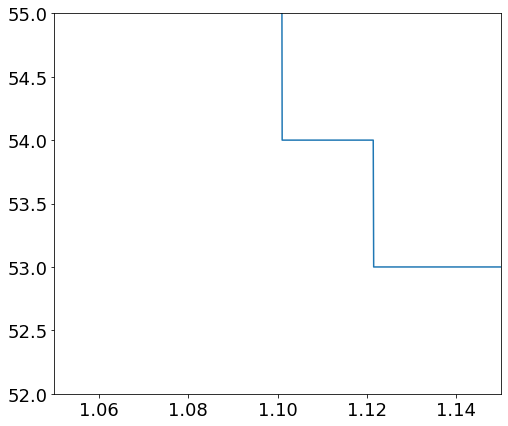

In [26]:
plt.plot(dnu_t, lenz)
plt.ylim([52, 55])
plt.xlim([1.05, 1.15])

In [6]:
signal = m_cii.maps

Loading .npz catalogues...


In [14]:
m_cii_v1 = lim('Lichen', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [15]:
signal_v1 = m_cii_v1.maps

Loading .npz catalogues...


In [3]:
signal = m_cii.maps
forecast = m_cii.noise_added_map

Loading .npz catalogues...


In [27]:
np.shape(signal)

(354, 354, 21)

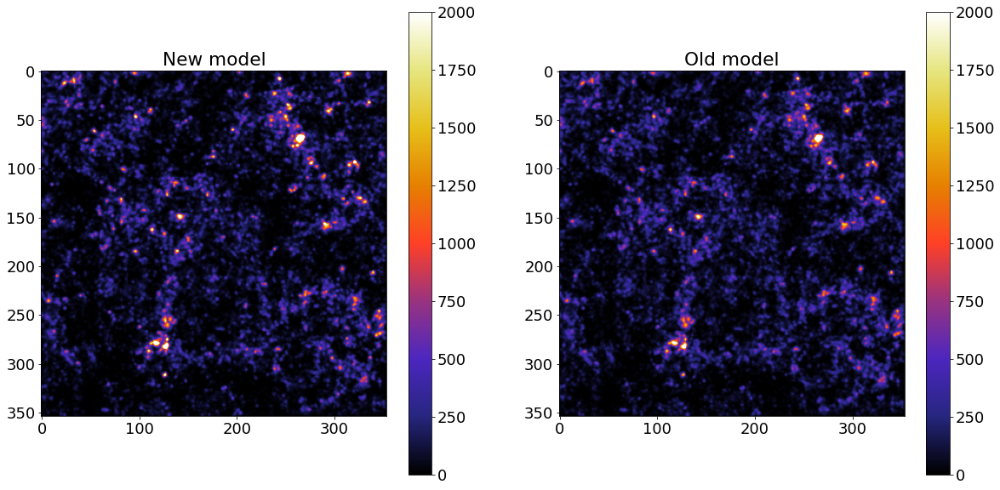

In [25]:
fig , axes = plt.subplots(nrows=1, ncols=2, figsize=(20,10))

plt.subplot(121)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('New model')
plt.colorbar()

plt.subplot(122)
plt.imshow(gaussian_filter(signal_v1[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('Old model')
plt.colorbar()

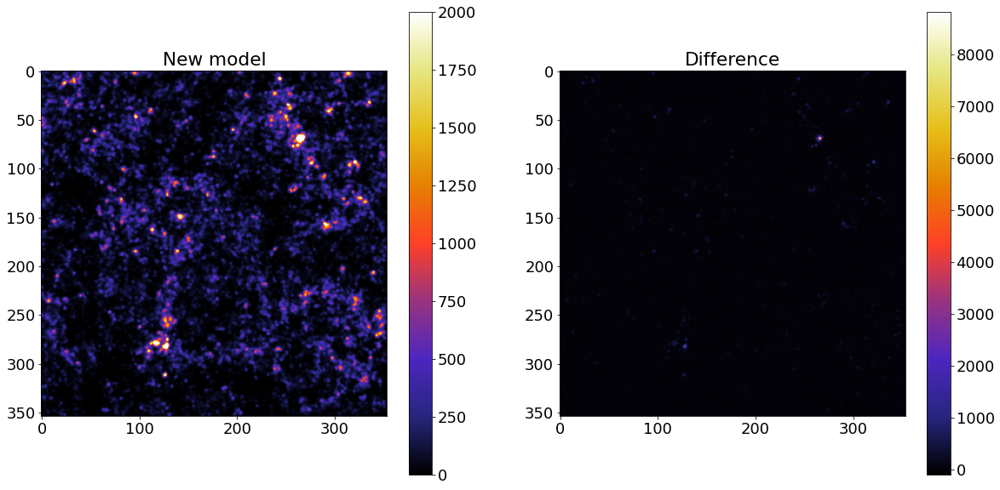

In [19]:
fig , axes = plt.subplots(nrows=1, ncols=2, figsize=(20,10))

plt.subplot(121)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('New model')
plt.colorbar()

plt.subplot(122)
plt.imshow(gaussian_filter((signal - signal_v1)[:, :, 3], 1), cmap = 'CMRmap')
plt.title('Difference')
plt.colorbar()

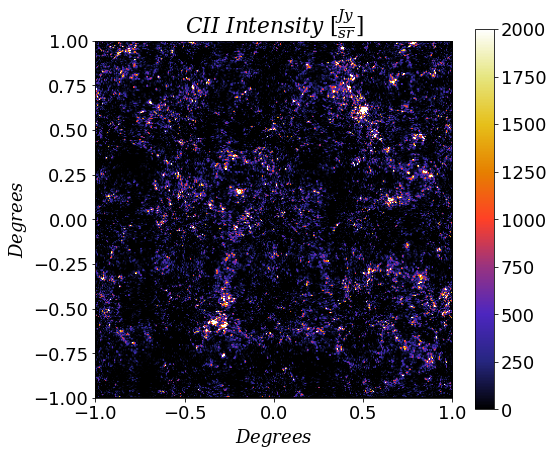

In [32]:
plt.imshow(signal[:, :, 3], cmap = 'CMRmap', vmax = 2000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()
plt.savefig('doga_CII_cb.pdf', bbox_inches = "tight")

In [8]:
zs[7]

5.982822085889565

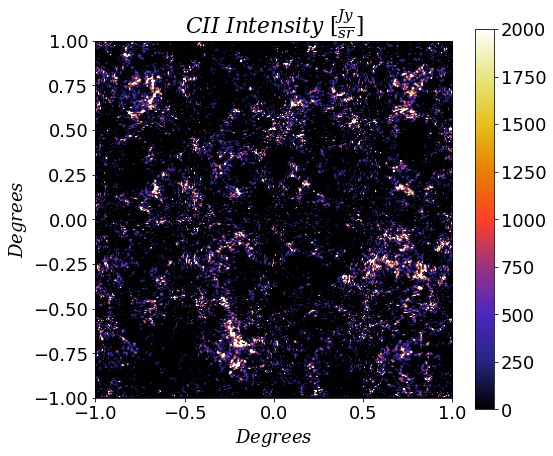

In [11]:
plt.imshow(signal[:, :, 7], cmap = 'CMRmap', vmax = 2000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

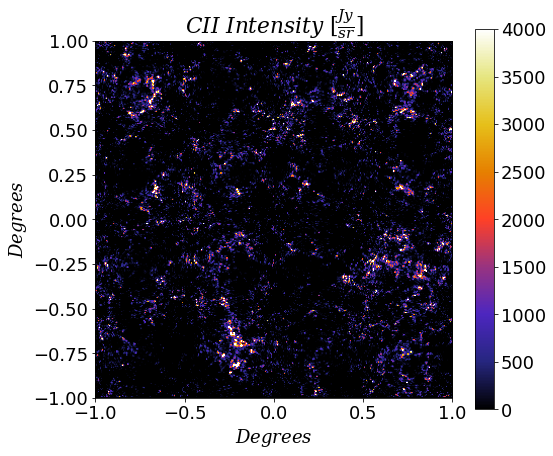

In [15]:
plt.imshow(signal[:, :, 7], cmap = 'CMRmap', vmax = 4000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()
plt.savefig('cii_z6.pdf', bbox_inches = "tight")

In [5]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1

/tmp/ipykernel_3687984/1780570680.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


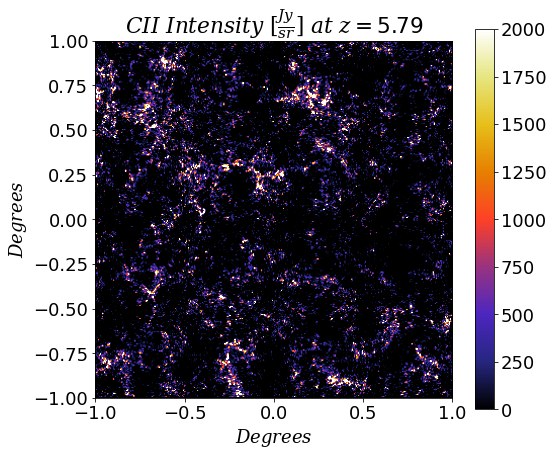

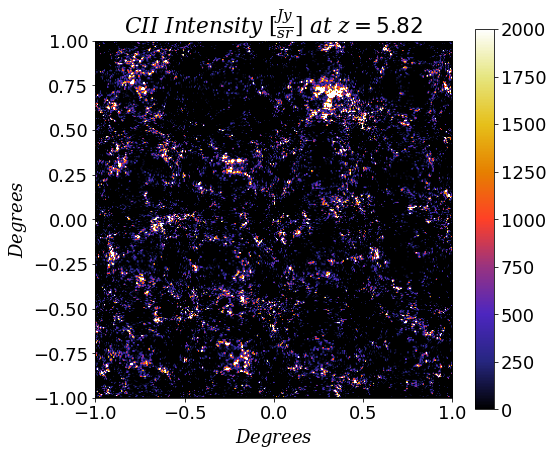

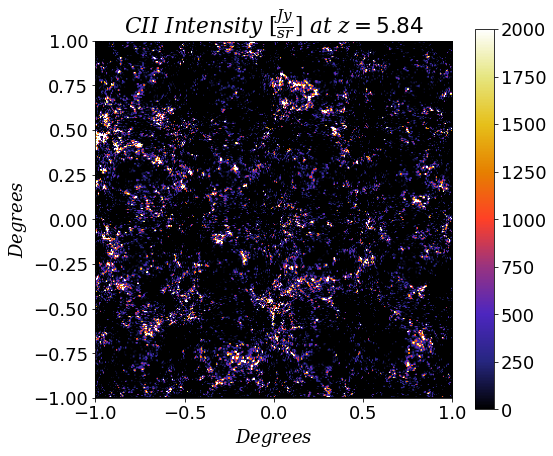

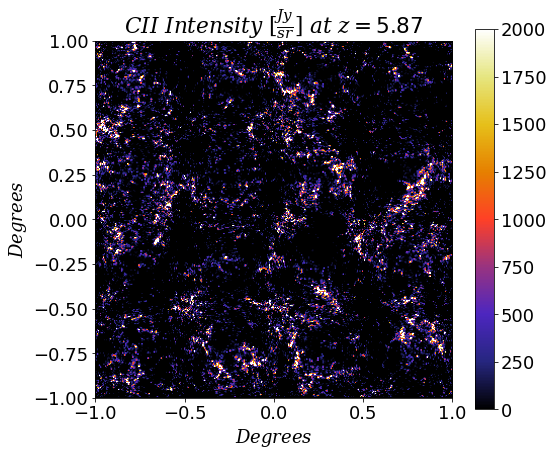

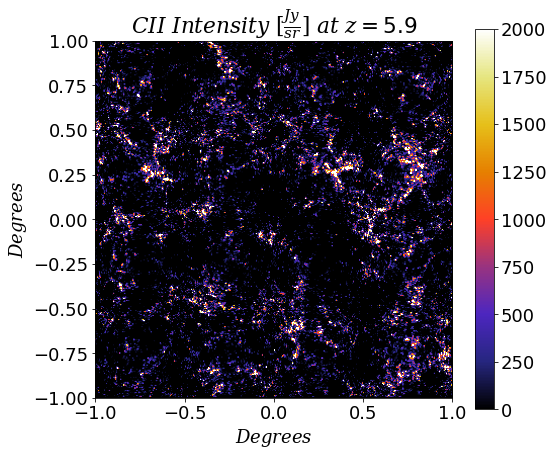

...

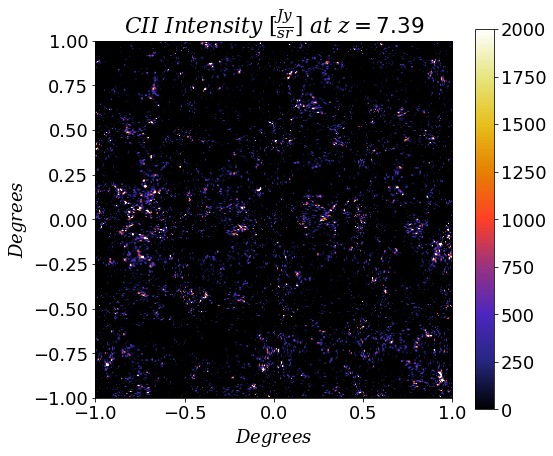

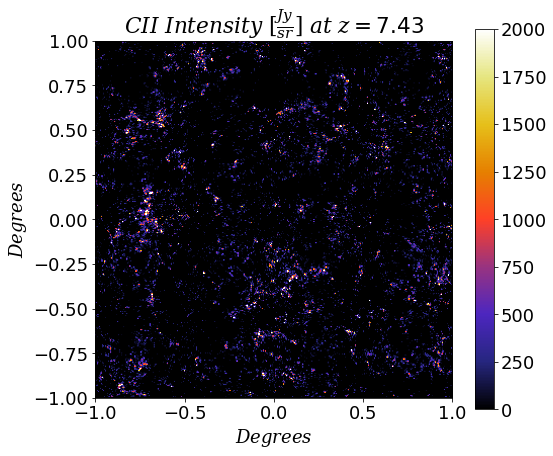

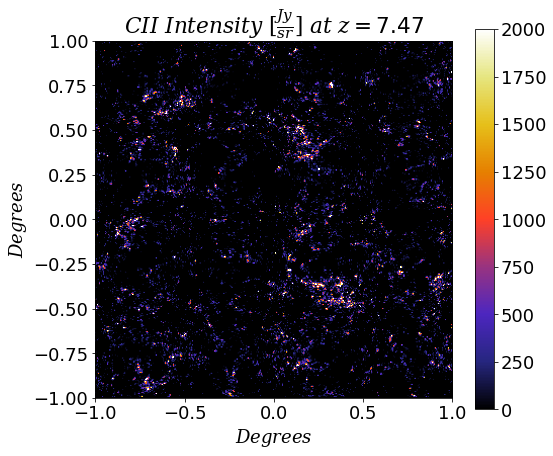

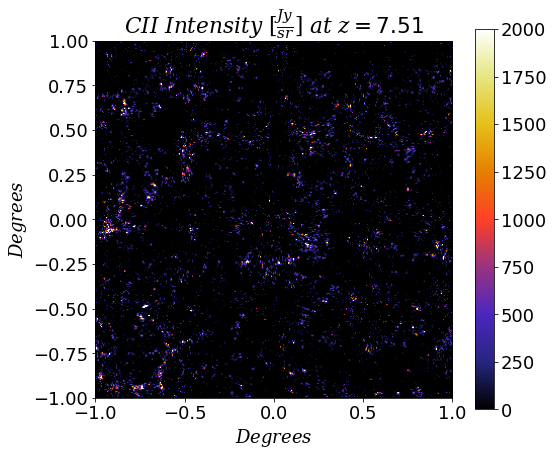

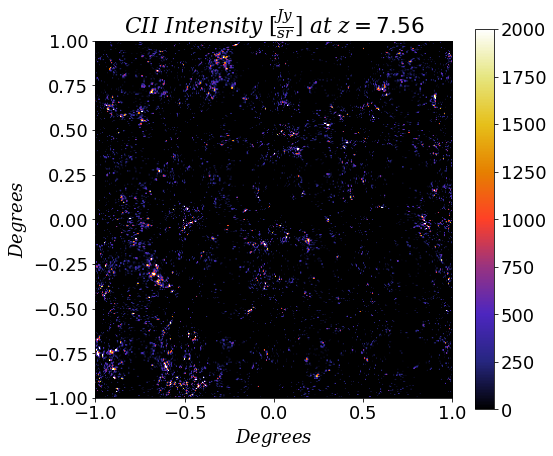

In [12]:
for i in range(len(zs) - 1):
    
    plt.figure(i)
    plt.imshow(signal[:, :, i], vmax = 2000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
    plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]\ at\ z=$'+str(round(zs[i], 2)), math_fontfamily = 'dejavuserif')
    plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
    plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
    plt.colorbar()
    plt.savefig('cii_snaps/'+str(i)+'.png', bbox_inches = "tight")

In [13]:
list_stack = ['cii_snaps/'+str(i)+'.png' for i in range(len(zs) - 1)]

In [15]:
import imageio
with imageio.get_writer('cii_movie.gif', mode='I') as writer:
    for filename in list_stack:
        image = imageio.imread(filename)
        writer.append_data(image)

/tmp/ipykernel_3687984/2674283545.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [33]:
np.max(signal[:, :, 3])

<Quantity 70670.29404294 Jy / sr>

In [20]:
k_sim = m_cii.k_sim
Pk_sim = m_cii.Pk_sim

In [21]:
k_sim_v1 = m_cii_v1.k_sim
Pk_sim_v1 = m_cii_v1.Pk_sim

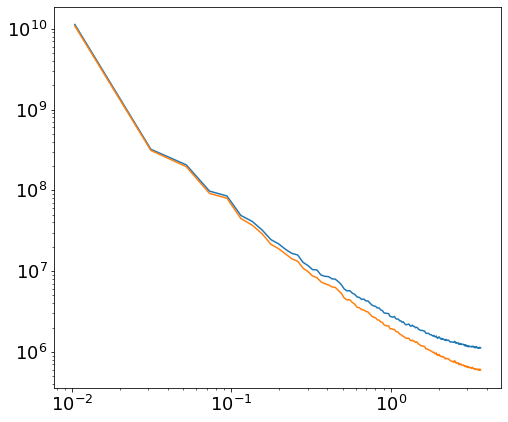

In [22]:
plt.plot(k_sim, Pk_sim)
plt.plot(k_sim_v1, Pk_sim_v1)
plt.xscale('log')
plt.yscale('log')

In [26]:
m_cii.dnu

<Quantity 2.8 GHz>